# Data processing

This notebook presents the code used to process the roof images to have a suitable dataset

In [2]:
import cv2
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
import sys
import pandas as pd
import geopandas as gpd
import seaborn as sns
import matplotlib.patches as patches
import os
from six.moves import cPickle as pickle
from sklearn.cluster import KMeans
from sklearn import datasets
import math
import json
from collections import deque
import matplotlib.gridspec as gridspec
from sklearn.utils.linear_assignment_ import linear_assignment

In [3]:
# Load the prepared data from pickle file

pickle_file = 'data/roof_dataset_prepared.pickle'

with open(pickle_file, 'rb') as f:
    save = pickle.load(f)
    roof_dataset = save['roof_dataset']
    bg_dataset = save['bg_dataset']
    buildings = save['buildings']
    bboxes_orig = save['bboxes_orig']
    del save  # hint to help gc free up memory

## Removal of outliers

In [4]:
# Calculation of the mean value in HSV space for each roof image
mean_hsv = np.zeros((roof_dataset.shape[0],3))
for i in range(roof_dataset.shape[0]):
    img = roof_dataset[i,:,:,:]
    img_hsv = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
    mean_hsv[i,:] = np.mean(img_hsv, axis=(0,1))

In [5]:
def show_dataset(dataset, grid_size=None, to_rgb=False, captions=None, main_title=None):
    '''Displays a sample of an image dataset.
    
    Args:
        dataset: a numpy array of images.
        grid_size: the grid size of images to display.
        to_rgb: should the images be converted to RGB from BGR.
        captions: list of captions to display above each image (same size as dataset).
        main_title: a main title to display on top of the grid.
    '''
    if grid_size is None:
        grid_size = (dataset.shape[0]//10+1,10)
    fig, axarr = plt.subplots(grid_size[0], grid_size[1], figsize=(20,2*grid_size[0]))
    fig.tight_layout() 
    for i in range(grid_size[0]):
        for j in range(grid_size[1]):
            k = i*grid_size[1]+j
            try:
                img = dataset[k]
                # if grayscale image
                if len(img.shape)==2:
                    img = 255 - img
                if to_rgb:
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            # no images -> fill with white
            except:
                img = np.ones(dataset[0].shape, dtype=np.uint8)* 255
            axarr[i, j].imshow(img)
            axarr[i, j].axis("off")
            if captions is not None:
                try:
                    axarr[i, j].set_title(captions[k])
                except:
                    pass
    if main_title is not None:
        plt.suptitle(main_title,fontsize=16)
    plt.show()  

In [6]:
def grid_coords(vec, n=10):
    '''Returns an array of equally spaced numbers between the min and the max of a given 1-D array.
    Args:
        vec: the array,
        n: the number of points to output.
    Returns:
        An array of n numbers.
    '''
    return np.arange(np.min(vec),np.max(vec), (np.max(vec)-np.min(vec))/n, dtype=int)

In [7]:
def grid_points(arr, ind, perp_lev, perp_step=5, main_step=5):
    '''Returns a 3D grid (between the min and max in ecah dimension) from a 3D array.
    '''
    grid_perp = grid_coords(arr[:,ind[2]], n=perp_step)
    grid_main = np.dstack(np.meshgrid(grid_coords(arr[:,ind[0]], n=main_step),
                                      grid_coords(arr[:,ind[1]], n=main_step))).reshape(-1, 2)
    grid_main = np.append(grid_main, np.ones((grid_main.shape[0],1))*grid_perp[perp_lev], axis=1)
    return grid_main

In [8]:
def closest_node(node, nodes):
    '''Returns the index and the value of the closest point from a given array to a given (other) point.
    '''
    deltas = nodes - node
    dist_2 = np.einsum('ij,ij->i', deltas, deltas)
    return np.argmin(dist_2), np.min(dist_2)

In [9]:
def show_hsv_imgs(dataset, mean_hsv, hsv_title=False, nb_lev=5):
    '''Displays a sample of images from a dataset on a grid of the HSV space.'''
    fig = plt.figure(figsize=(20, 4))#(20, 12)
    outer = gridspec.GridSpec(1, nb_lev, wspace=0.2, hspace=0.2)

    var = ['Hue','Saturation','Value']
    lev = ['min', 'low', 'medium', 'high', 'max']
    ind = deque(range(3))
    to_rgb=True

    for i in range(1):
        for j in range(nb_lev):
            inner = gridspec.GridSpecFromSubplotSpec(5, 5,
                    subplot_spec=outer[i*nb_lev+j], wspace=0.1, hspace=0.1)
            hsv_grid = grid_points(mean_hsv, ind, j)
            closest_pts = np.array([closest_node(pt, mean_hsv[:,ind]) for pt in hsv_grid], dtype=int)
            too_far_pts = closest_pts[:,1]>200
            hsv_grid_imgs = dataset[closest_pts[:,0]]
            hsv_grid_mean = mean_hsv[closest_pts[:,0]]
            #hsv_grid_imgs[too_far_pts]=255

            for k in range(25):
                ax = plt.Subplot(fig, inner[k])
                img = hsv_grid_imgs[k]
                if to_rgb:
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                ax.imshow(img)
                ax.axis("off")
                if ax.colNum==2 and ax.is_first_row():
                    ax.set_title('{0} vs {1}, {2} {3}'.format(var[ind[0]],var[ind[1]], lev[j], var[ind[2]]))
                if hsv_title:
                    hsv = hsv_grid_mean[k]
                    ax.set_title('{0}, {1}, {2}'.format(int(hsv[0]), int(hsv[1]), int(hsv[2])))
                fig.add_subplot(ax)

        ind.rotate()
    plt.show()

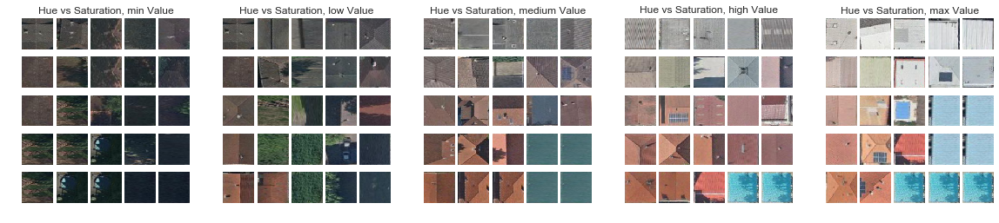

In [10]:
show_hsv_imgs(roof_dataset, mean_hsv)

In [11]:
blue = (mean_hsv[:,0]>80) & (mean_hsv[:,0]<100) & (mean_hsv[:,1]>60) & (mean_hsv[:,1]>100)
np.sum(blue)

4

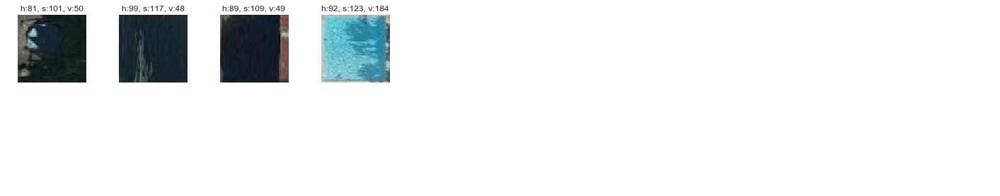

In [12]:
captions = ['h:{0}, s:{1}, v:{2}'.format(int(hsv[0]), int(hsv[1]), int(hsv[2])) for hsv in mean_hsv[blue]]
show_dataset(roof_dataset[blue], grid_size=(2,10), to_rgb=True, captions=captions)

In [13]:
green = (mean_hsv[:,0]>50) & (mean_hsv[:,0]<90) & (mean_hsv[:,1]>50) & (mean_hsv[:,2]<120)
np.sum(green)

195

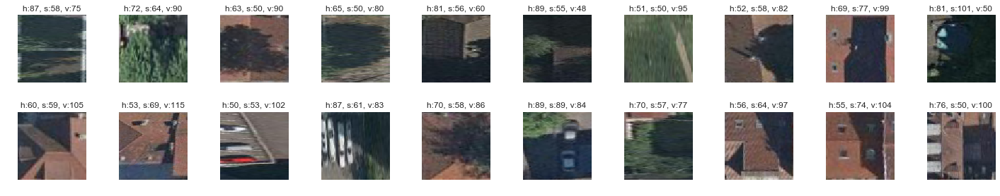

In [14]:
captions = ['h:{0}, s:{1}, v:{2}'.format(int(hsv[0]), int(hsv[1]), int(hsv[2])) for hsv in mean_hsv[green]]
show_dataset(roof_dataset[green], grid_size=(2,10), to_rgb=True, captions=captions)

In [15]:
too_dark = mean_hsv[:,2]<80
np.sum(too_dark)

140

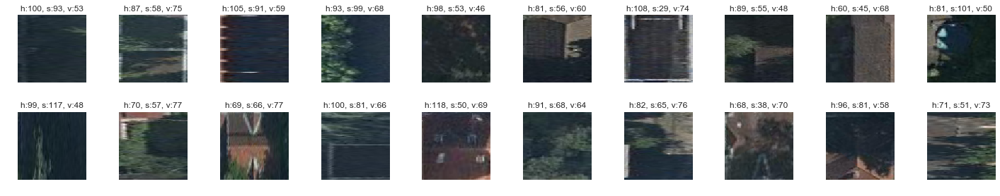

In [16]:
captions = ['h:{0}, s:{1}, v:{2}'.format(int(hsv[0]), int(hsv[1]), int(hsv[2])) for hsv in mean_hsv[too_dark]]
show_dataset(roof_dataset[too_dark], grid_size=(2,10), to_rgb=True, captions=captions)

In [17]:
too_light = mean_hsv[:,2]>220
np.sum(too_light)

26

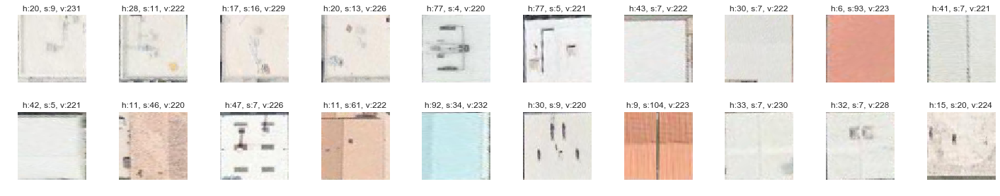

In [18]:
captions = ['h:{0}, s:{1}, v:{2}'.format(int(hsv[0]), int(hsv[1]), int(hsv[2])) for hsv in mean_hsv[too_light]]
show_dataset(roof_dataset[too_light], grid_size=(2,10), to_rgb=True, captions=captions)

In [19]:
keep = ~green & ~blue & ~too_dark & ~too_light

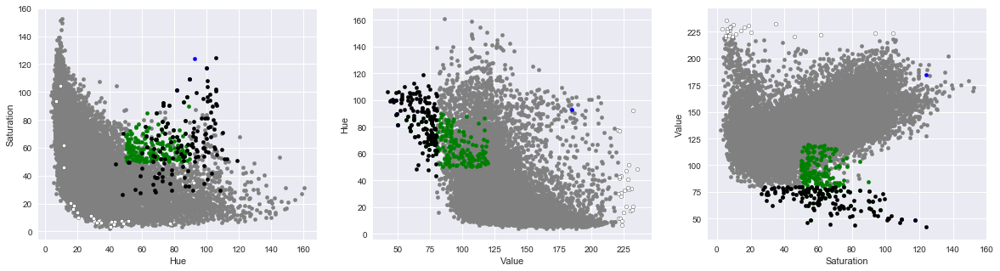

In [20]:
fig, axarr = plt.subplots(1,3, figsize=(20,5))
var = ['Hue','Saturation','Value']
ind = deque(range(3))
for k in range(3):
    i,j,_=list(ind)
    ind.rotate()
    axarr[k].set_xlabel(var[i])
    axarr[k].set_ylabel(var[j])
    axarr[k].scatter(mean_hsv[keep,i], mean_hsv[keep,j], s=20, c='grey')
    axarr[k].scatter(mean_hsv[green,i], mean_hsv[green,j], s=20, c='green')
    axarr[k].scatter(mean_hsv[blue,i], mean_hsv[blue,j], s=20, c='blue')
    axarr[k].scatter(mean_hsv[too_dark,i], mean_hsv[too_dark,j], s=20, c='black')
    axarr[k].scatter(mean_hsv[too_light,i], mean_hsv[too_light,j], s=20, c='white',edgecolors='black')
plt.show()

In [21]:
# The dataset is cleaned from images that do not correspond to suitable roofs
roof_dataset_clean = roof_dataset[keep]
mean_hsv_clean = mean_hsv[keep]
bg_dataset_clean= bg_dataset[keep]
buildings_clean = buildings[keep]
bboxes_orig_clean = [bb for bb,k in zip(bboxes_orig,keep) if k==True]

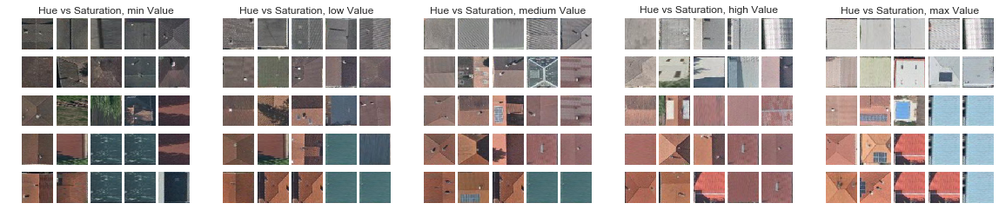

In [22]:
show_hsv_imgs(roof_dataset_clean, mean_hsv_clean, hsv_title=False, nb_lev=5)

## Processing of roof images

In [23]:
# Selection of a sample of 200 roof images
np.random.seed(seed=124)
sample_ind = np.random.choice(range(roof_dataset_clean.shape[0]), 200, replace=False)

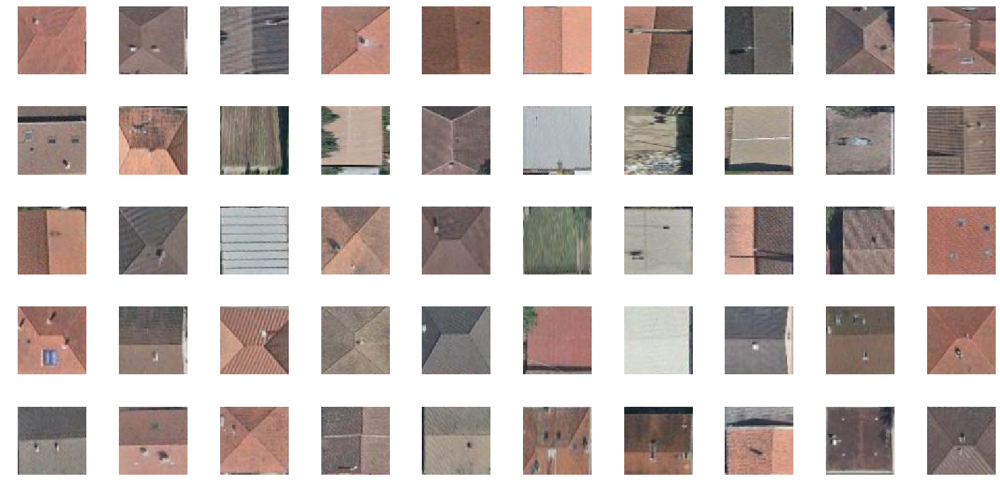

In [24]:
show_dataset(roof_dataset_clean[sample_ind], grid_size=(5,10), to_rgb=True)

In [25]:
def sharpen_roof(img):
    img_blur = cv2.bilateralFilter(img,9,100,100)
    tp_blur = cv2.GaussianBlur(img_blur, (5, 5), 3);
    img_sharp = cv2.addWeighted(img_blur, 2, tp_blur, -1, 0)
    return(img_sharp)

In [26]:
def eq_roof(img):
    img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
    # equalize the histogram of the Y channel
    img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])
    # convert the YUV image back to RGB format
    img_eq = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)
    return(img_eq)

In [27]:
def red_roof(img):
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_resized = cv2.resize(img_gray, (28,28))
    img_reblur = cv2.bilateralFilter(img_resized,9,75,75)
    return(img_reblur)

In [28]:
def orient_roof(img):
    w, h = img.shape
    L = img[:,0:w/2]
    R = img[:,w/2:w]
    U = img[0:h/2,:]
    D = img[h/2:h,:]
    
    himgs = [L,U,R,D]
    himgs_norm = [np.linalg.norm(himg) for himg in himgs]
    # find the clearer half
    maxH = np.argmax(np.array(himgs_norm))
    nb_rot = range(4) 
    # rotate to have the clearer half to the right
    rotated = np.rot90(img, k=nb_rot[maxH])
    
    # flip the image U<->D if the U-D darkest half is to the top
    U2 = rotated[0:h/2,:]
    D2 = rotated[h/2:h,:]
    UNorm = np.linalg.norm(U2)
    DNorm = np.linalg.norm(D2)
    if UNorm > DNorm:
        oriented = np.flipud(rotated)
    else:
        oriented = rotated
    
    #to visualize:
    #himgs = [img,L,R,U,D,rotated,U2,D2,oriented]
    #captions=['full','L','R','U','D','rotated','U2','D2','oriented']
    #fig, axarr = plt.subplots(1,len(himgs), figsize=(20,4))
    #for i, himg in enumerate(himgs):
    #    axarr[i].set_title(captions[i])
    #    axarr[i].imshow(himg)
    #    axarr[i].axis('off')
    #plt.show()
    #print('LDRU',[int(himg_norm) for himg_norm in himgs_norm])
    #print('UD', int(UNorm), int(DNorm))
    
    return oriented

In [29]:
roof_dataset_sharp = np.zeros((roof_dataset_clean.shape[0],64,64,3),dtype = np.uint8)
roof_dataset_eq = np.zeros((roof_dataset_clean.shape[0],64,64,3),dtype = np.uint8)
roof_dataset_red = np.zeros((roof_dataset_clean.shape[0],28,28))
roof_dataset_orient = np.zeros((roof_dataset_clean.shape[0],28,28))

for i in range(roof_dataset_clean.shape[0]):
    img = roof_dataset_clean[i,:,:,:]
    img = sharpen_roof(img)
    roof_dataset_sharp[i,:,:,:] = img
    img = eq_roof(img)
    roof_dataset_eq[i,:,:,:] = img
    img = red_roof(img)
    roof_dataset_red[i,:,:] = img
    img = orient_roof(img)
    roof_dataset_orient[i,:,:] = img

In [30]:
#to visualize the orientation function (uncomment in function)
#for i in range(30,60):
#    img = roof_dataset[i]
#    orimg = orient_roof(img)

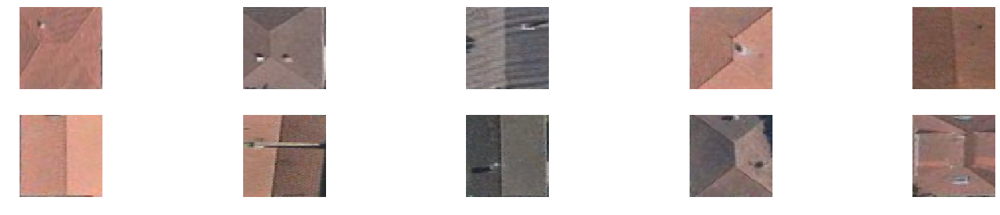

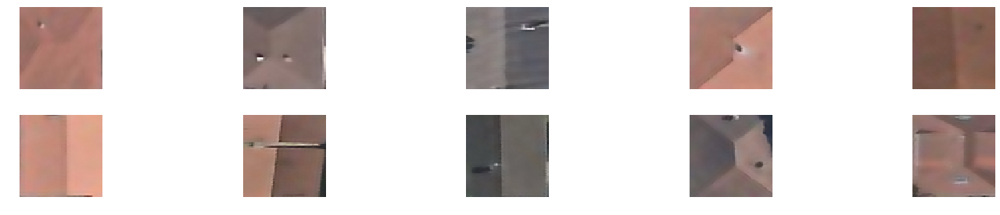

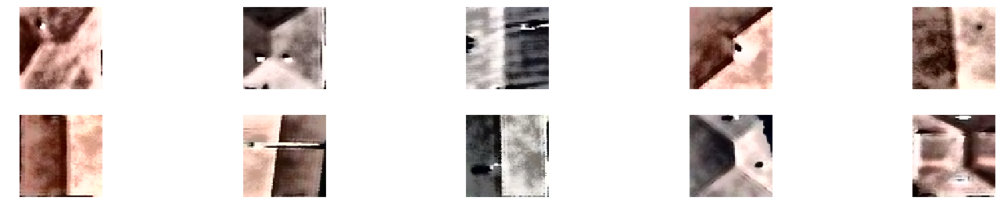

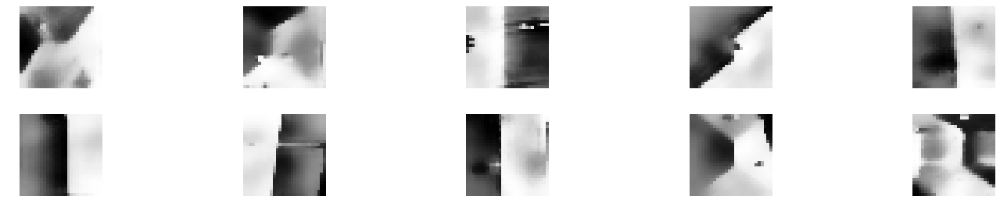

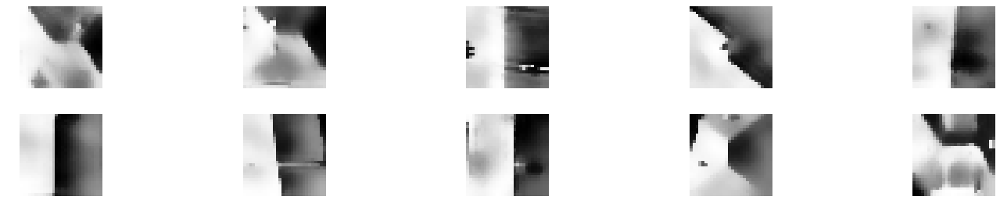

In [31]:
show_dataset(roof_dataset_clean[sample_ind], grid_size=(2,5), to_rgb=True)
show_dataset(roof_dataset_sharp[sample_ind], grid_size=(2,5), to_rgb=True)
show_dataset(roof_dataset_eq[sample_ind], grid_size=(2,5), to_rgb=True)
show_dataset(roof_dataset_red[sample_ind], grid_size=(2,5))
show_dataset(roof_dataset_orient[sample_ind], grid_size=(2,5))

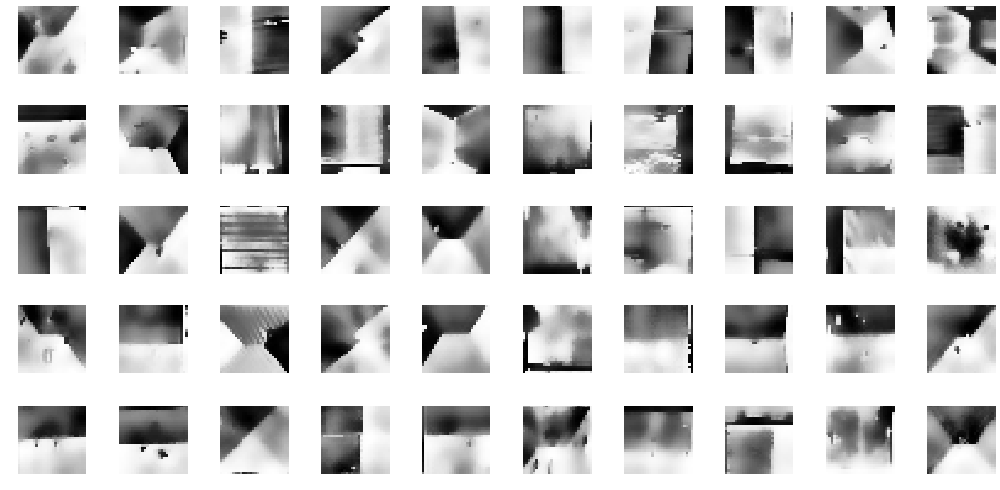

In [32]:
show_dataset(roof_dataset_red[sample_ind], grid_size=(5,10))

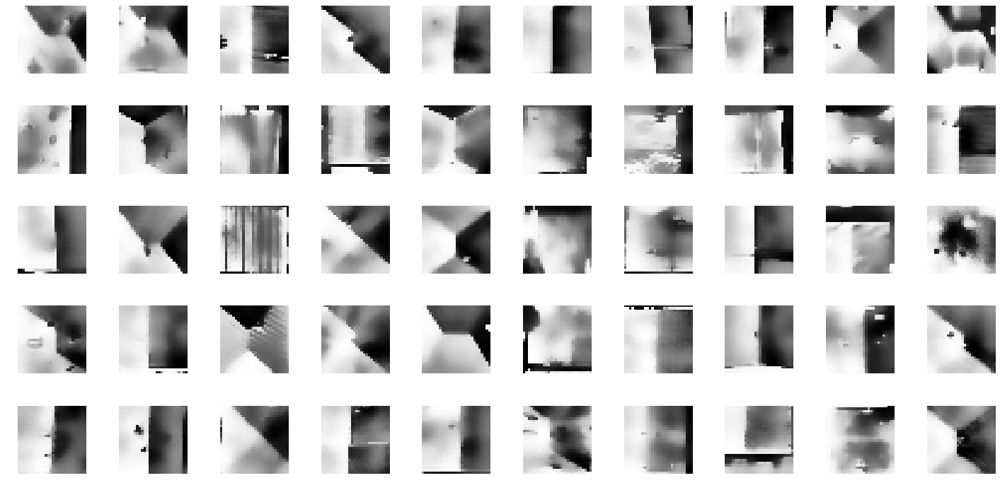

In [33]:
show_dataset(roof_dataset_orient[sample_ind], grid_size=(5,10))

In [34]:
def auto_canny(image, sigma=0.33):
    # compute the median of the single channel pixel intensities
    v = np.median(image)

    # apply automatic Canny edge detection using the computed median
    lower = int(max(0, (1.0 - sigma) * v))
    upper = int(min(255, (1.0 + sigma) * v))
    edged = cv2.Canny(image, lower, upper)

    # return the edged image
    return edged

In [35]:
edges_dataset = np.zeros((roof_dataset_clean.shape[0],28,28))
for i in range(roof_dataset_clean.shape[0]):
    img = np.uint8(roof_dataset_orient[i])
    edges_dataset[i,:,:] = auto_canny(img)

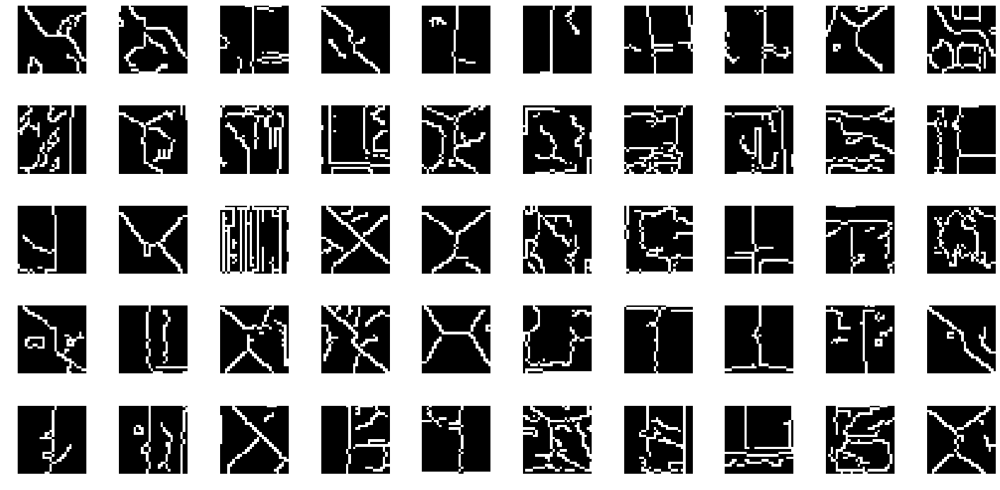

In [36]:
show_dataset(edges_dataset[sample_ind], grid_size=(5,10))

In [37]:
roof_dataset_orig = roof_dataset_clean
roof_dataset = roof_dataset_orient

In [38]:
# Save data to pickle file

pickle_file = 'data/roofs_dataset_processed.pickle'

try:
    f = open(pickle_file, 'wb')
    save = {
    'roof_dataset_orig': roof_dataset_orig,
    'bg_dataset': bg_dataset_clean,
    'buildings': buildings_clean,
    'bboxes_orig': bboxes_orig_clean,
    'roof_dataset': roof_dataset
    }
    pickle.dump(save, f, protocol=2)
    f.close()
except Exception as e:
    print('Unable to save data to', pickle_file, ':', e)
    raise

## Symetry analysis

In [39]:
def get_img_sym(img):
    w, h = img.shape
    L = img[:,0:w/2]
    R = np.fliplr(img[:,w/2:w])
    U = img[0:h/2,:]
    D = np.flipud(img[h/2:h,:])
    max_img = np.ones((w/2,w))*255
    HSym = 1 - np.linalg.norm(L-R)/np.linalg.norm(max_img)
    VSym = 1 - np.linalg.norm(U-D)/np.linalg.norm(max_img)
    
    #to visualize:
    #himgs = [img,L,R,U,D, L-R,U-D]
    #captions=['full','L','R','U','D','L-R','U-D']
    #fig, axarr = plt.subplots(1,len(himgs), figsize=(20,4))
    #for i, himg in enumerate(himgs):
    #    axarr[i].set_title(captions[i])
    #    axarr[i].imshow(himg)
    #    axarr[i].axis('off')
    #plt.show()
    #print HSym, VSym
    return HSym, VSym

In [40]:
#to visualize the orientation function (uncomment in function)
#for i in range(30,60):
#    img = roof_dataset[i]
#    orimg = get_img_sym(img)

In [41]:
roof_sym = np.array([get_img_sym(img) for img in roof_dataset])

In [42]:
sym_kmeans = KMeans(n_clusters=3, random_state=0).fit_predict(roof_sym)

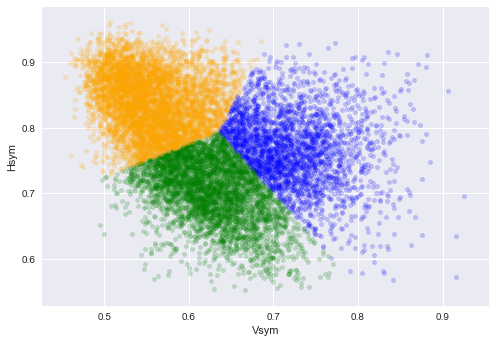

In [43]:
color=['blue','green','orange', 'purple', 'cyan']
fig, ax = plt.subplots(1)
for k in set(sym_kmeans):
    ax.scatter(roof_sym[sym_kmeans==k,0], roof_sym[sym_kmeans==k,1], s=20, c=color[k], alpha=0.2)
ax.set_xlabel("Vsym")
ax.set_ylabel("Hsym")
plt.show()

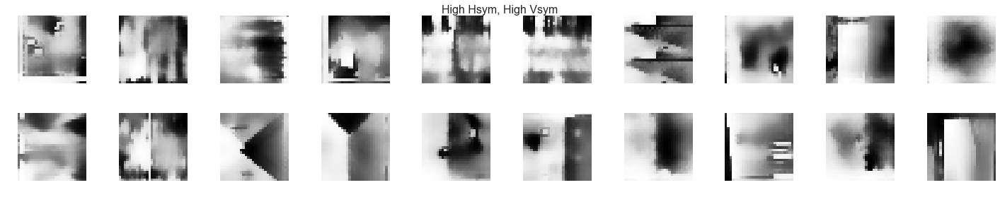

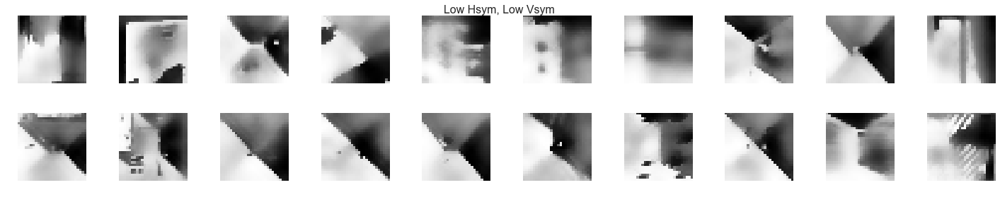

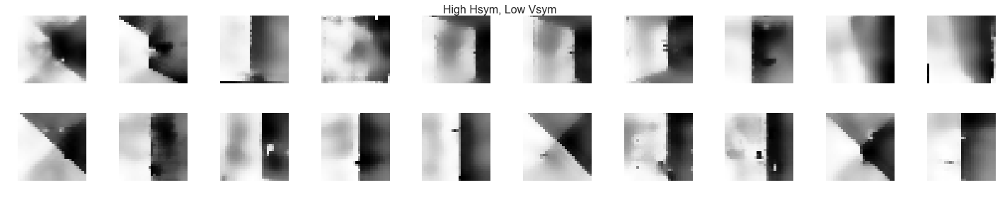

In [44]:
sym_titles = ['High Hsym, High Vsym', 'Low Hsym, Low Vsym', 'High Hsym, Low Vsym']
for k in set(sym_kmeans):
    show_dataset(roof_dataset[sym_kmeans==k], grid_size=(2,10), main_title=sym_titles[k])

#### Labelling of a sample dataset

With initialize the labelling with the kmeans cluster found above.
We display the images of the sample and correct the labelling in a csv file.

In [45]:
pics_dir = "data/images"

def get_filename(building, subsel, treat):
    return os.path.join(pics_dir, subsel, treat, str(building.name) + ".jpg")

def get_poly_rel(building, ext=0.0):
    bbox = building.geometry.bounds
    bbox_ext = building.geometry.buffer(ext).bounds
    orig = bbox_ext[0], bbox_ext[3]
    size = (bbox_ext[2]-bbox_ext[0], bbox_ext[1]-bbox_ext[3])
    poly = list(building.geometry.exterior.coords)
    poly_rel = [[((c-o)/sz) for c,o,sz in zip(pt, orig, size)] for pt in poly]
    return poly_rel

def show_building(building):
    img = cv2.imread(get_filename(building, 'full', 'orig'))
    img_shape = img.shape[1],img.shape[0]
    poly_rel = get_poly_rel(building, ext=10.0)
    poly_img = [[p*sz for p,sz in zip(pt, img_shape)] for pt in poly_rel]
    fig,ax = plt.subplots(1)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(img_rgb)
    ax.axis("off")
    patch = patches.Polygon(poly_img, linewidth=1,edgecolor='r',facecolor='none')
    ax.add_patch(patch)
    plt.show()

In [46]:
types = ['flat', 'gable', 'pyramid_or_hip', 'complex', 'not_a_roof']
roof_types=pd.DataFrame(types, columns=['type'])
roof_types

,type
0,flat
1,gable
2,pyramid_or_hip
3,complex
4,not_a_roof


In [587]:
roofs_lab = pd.DataFrame(index=sample_ind, columns=['ind','lab'])
kmeans_type=[0,2,1] # correspondance between the previous kmeans clustering and the types definition
roofs_lab['lab']=[kmeans_type[k] for k in sym_kmeans[sample_ind]]
roofs_lab['ind']=roofs_lab.index

In [588]:
roofs_lab.sort_values(by=['lab','ind']).to_csv('data/sample_labels_init.csv',index=False)

90


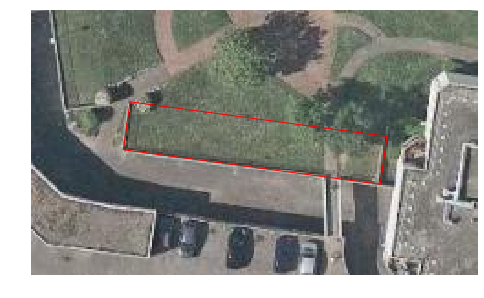

421


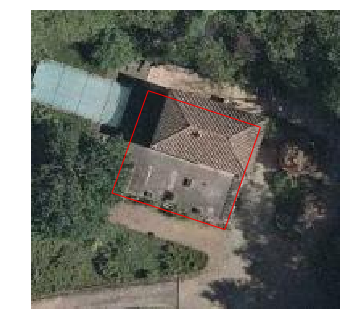

619


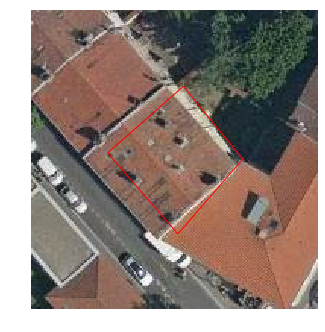

718


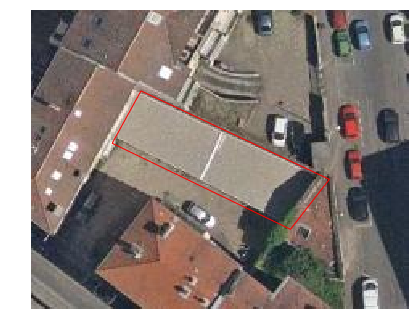

1128


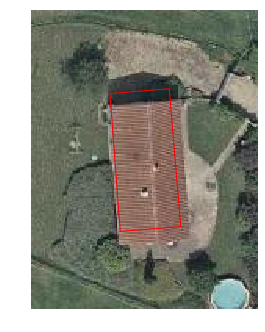

1388


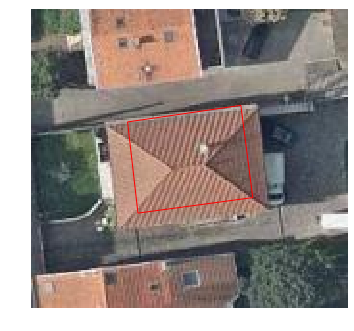

1608


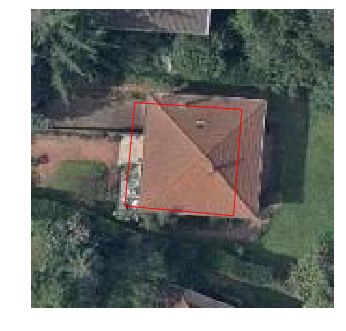

1642


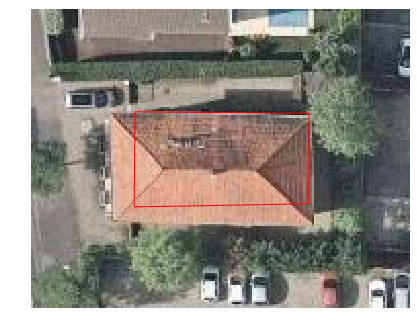

1681


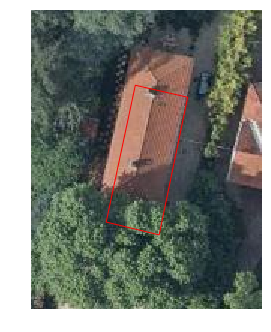

1838


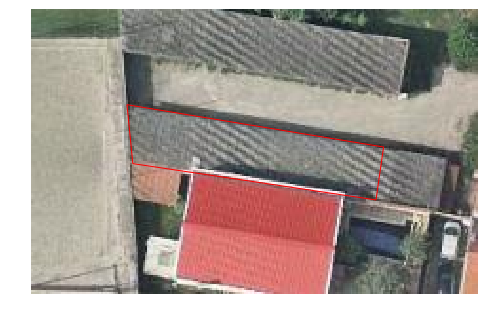

1971


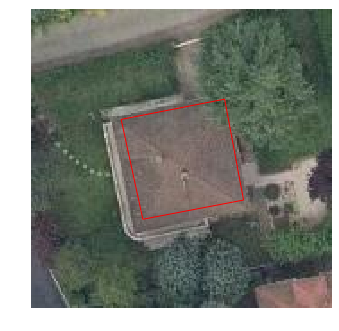

2034


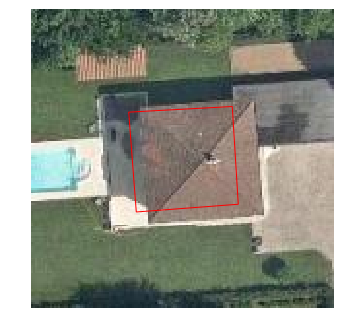

2118


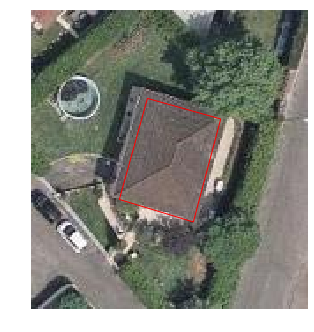

2565


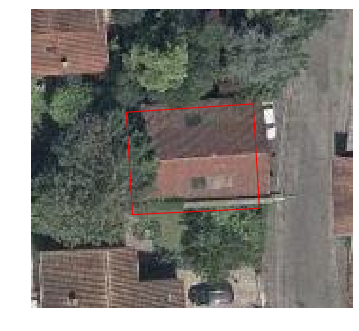

3074


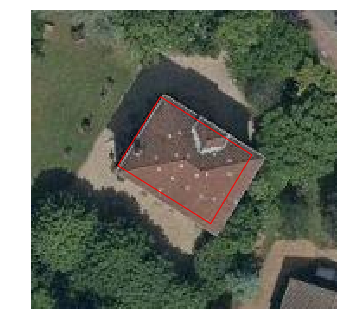

3251


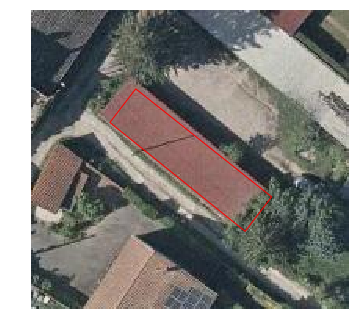

3470


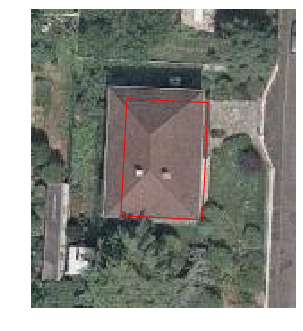

3565


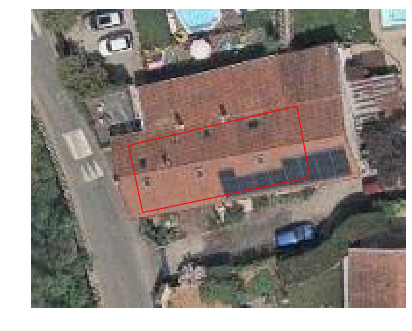

3809


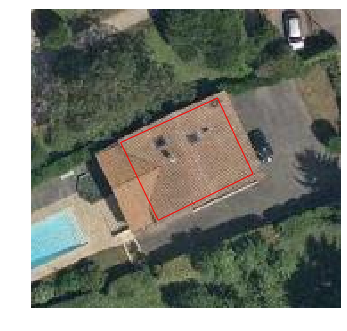

3823


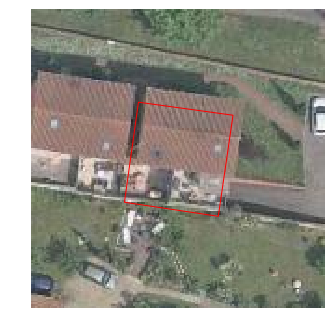

3942


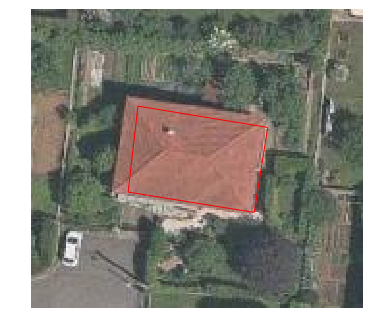

4008


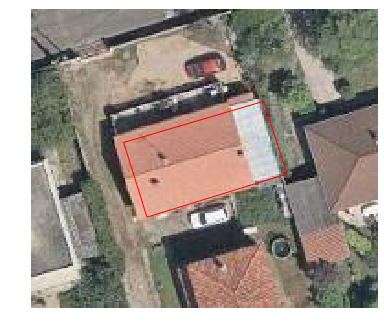

4169


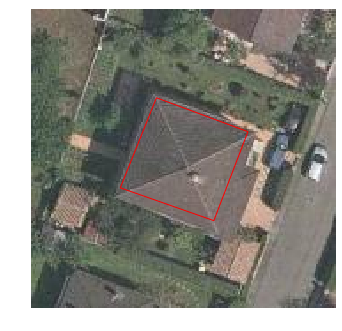

4330


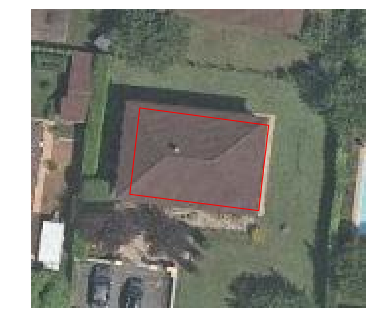

4515


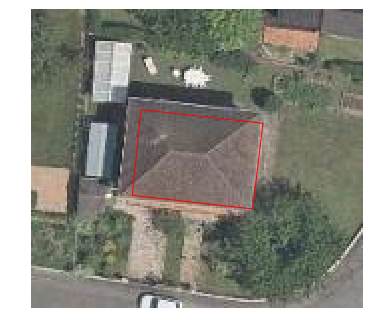

4552


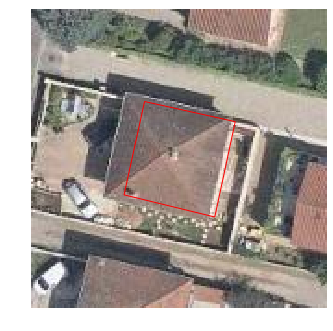

4821


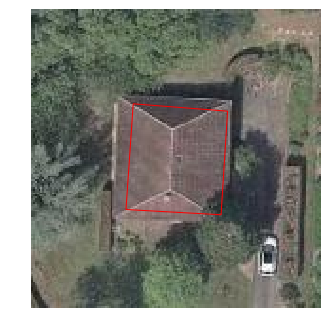

4830


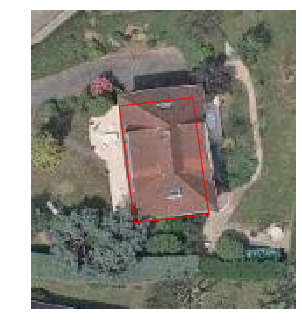

4894


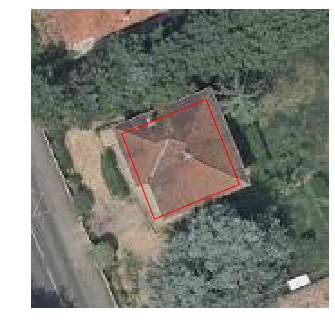

5313


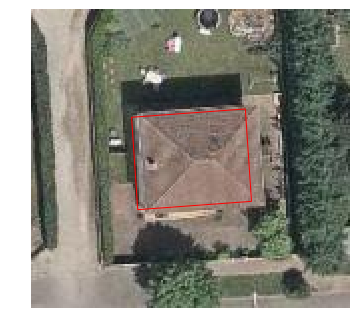

5434


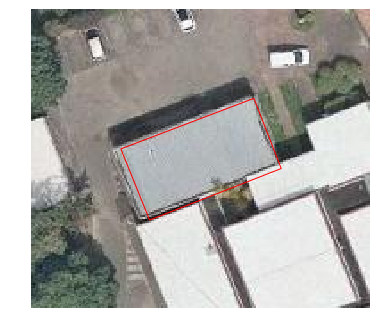

5562


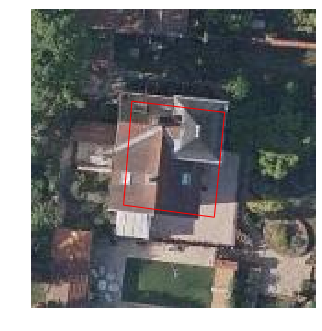

5653


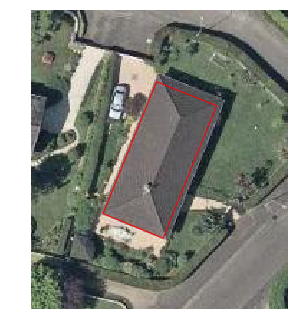

5809


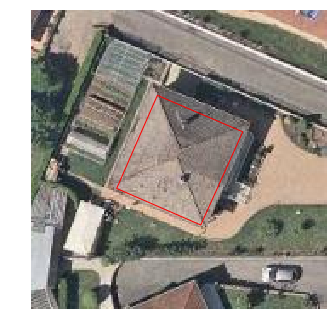

5943


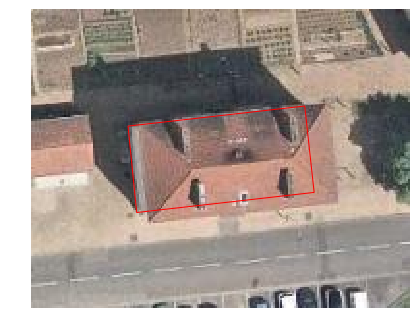

5961


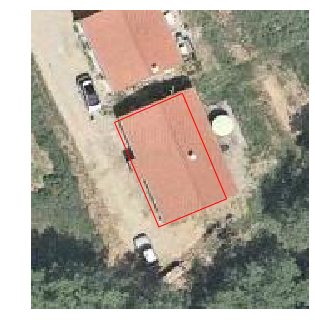

6172


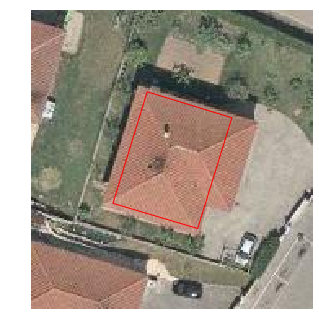

6424


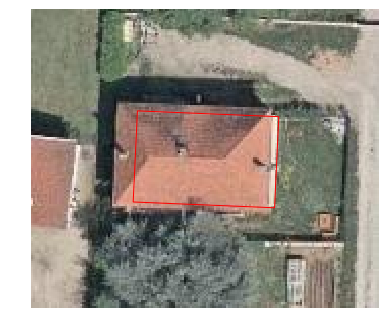

6577


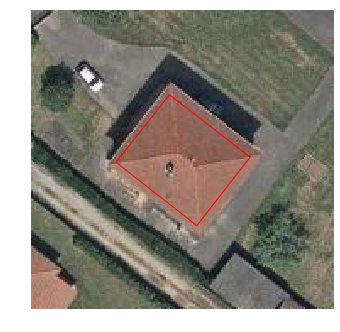

6998


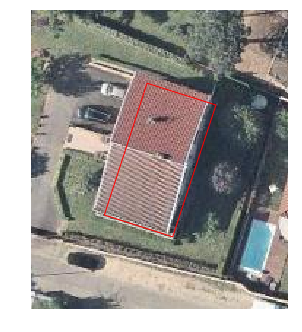

7114


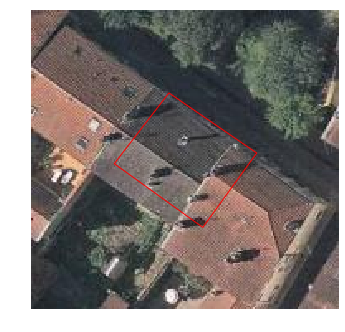

7255


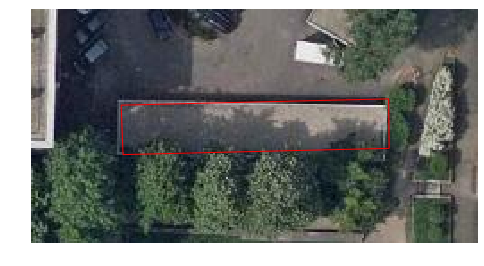

7375


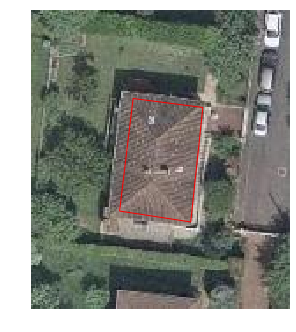

7432


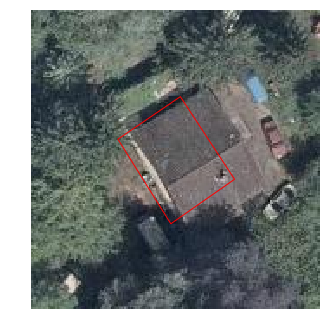

7580


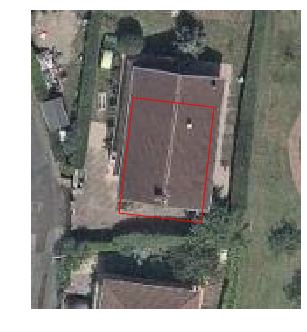

7892


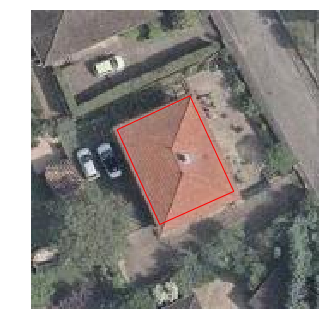

8033


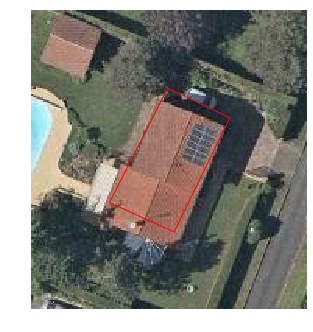

8112


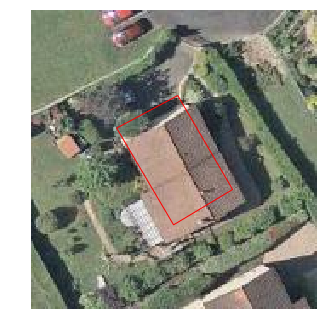

8130


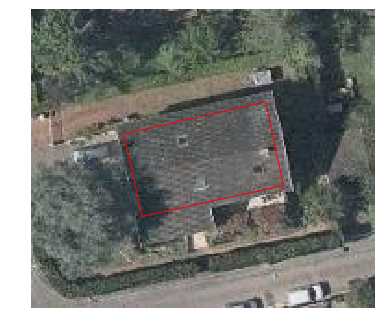

8396


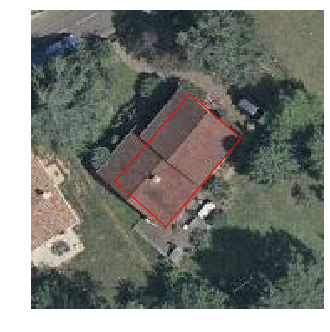

8620


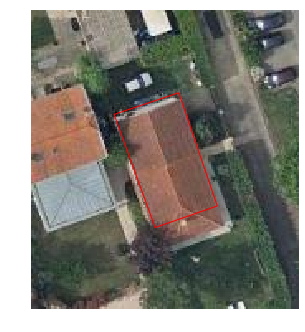

8635


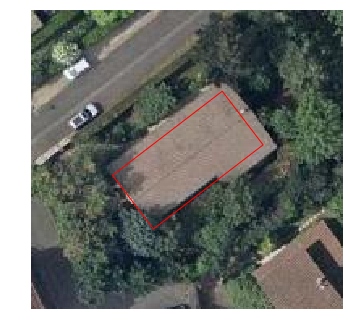

8681


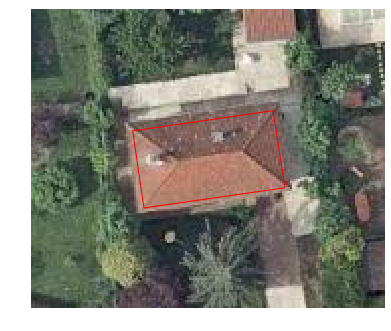

9277


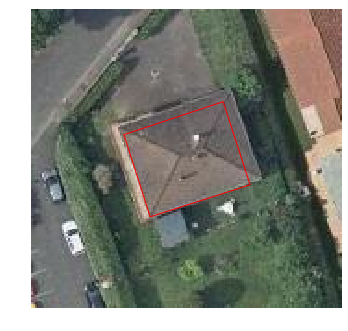

9418


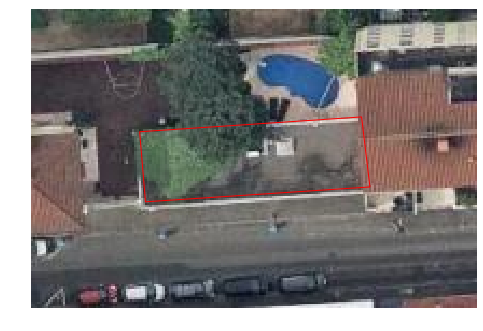

9735


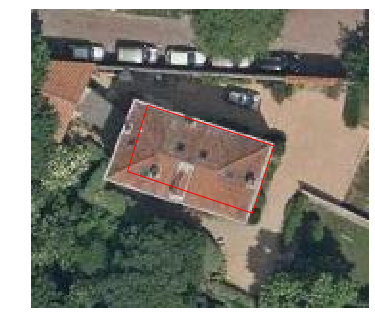

9742


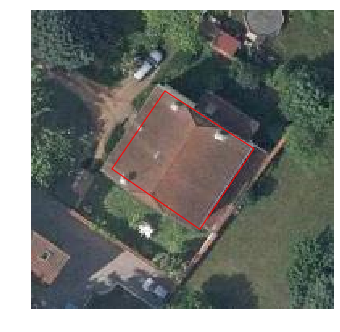

10127


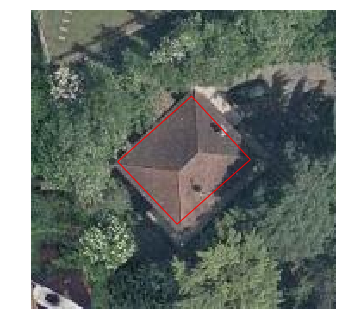

10225


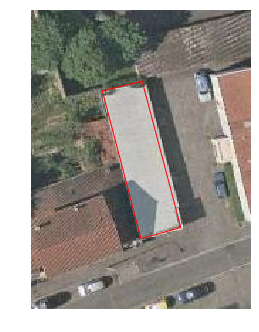

10330


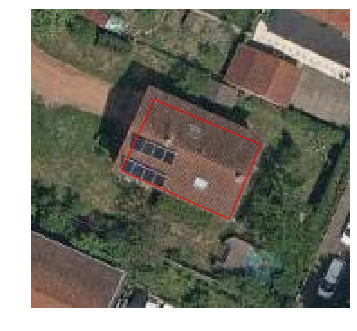

10460


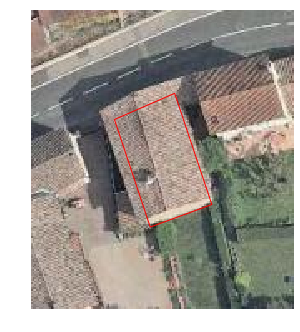

10489


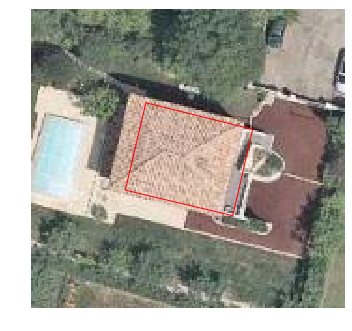

10917


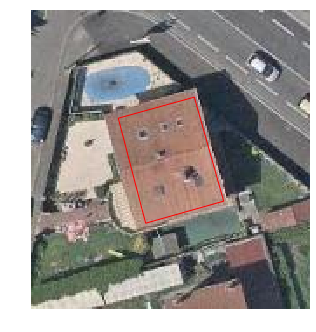

10933


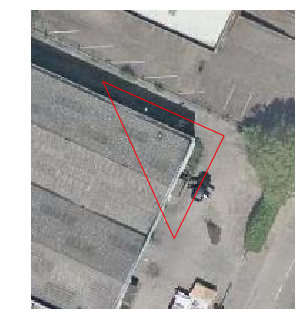

11103


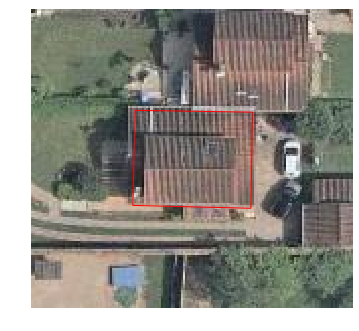

11581


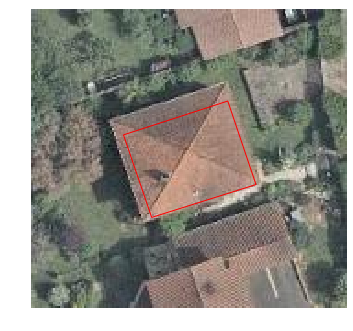

11743


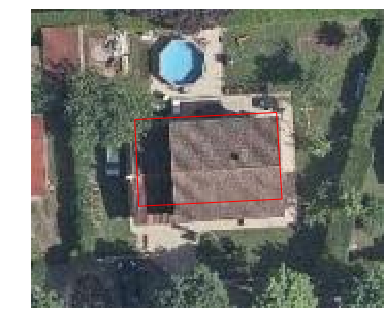

11829


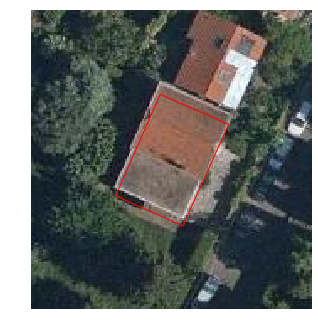

11912


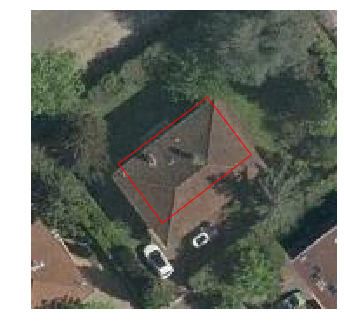

11920


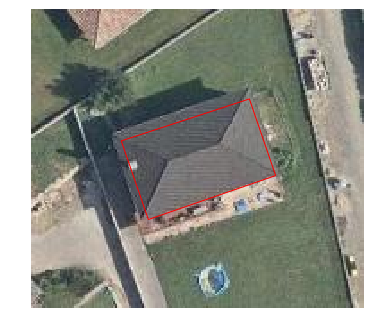

11947


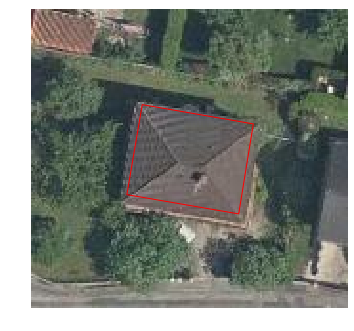

12275


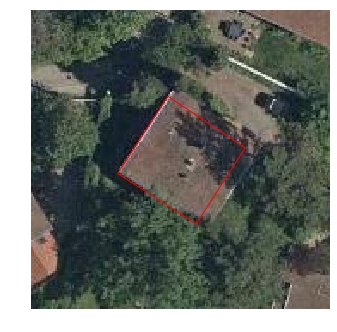

12503


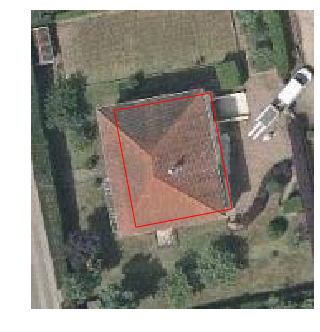

In [594]:
sample_sind = np.sort(sample_ind)
buildings_sample = buildings_clean.iloc[sample_sind]
# change k value to see each cluster
k=2
buildings_sample_k = buildings_sample.iloc[sym_kmeans[sample_sind]==kmeans_type[k]]
for ind,(_,building) in zip(sample_sind[sym_kmeans[sample_sind]==kmeans_type[k]],buildings_sample_k.iterrows()):
    print(ind)
    show_building(building)

In [57]:
roofs_lab_comp=pd.read_csv('data/sample_labels_corr.csv')

In [58]:
roofs_lab_comp.groupby('lab').count()

,ind
lab,
0,27
1,92
2,61
3,16
4,4


#### Labelling of a sample dataset for testing

In [47]:
test_sample_ind = np.random.choice(range(roof_dataset_clean.shape[0]), 100, replace=False)

In [48]:
test_roofs_lab = pd.DataFrame(index=test_sample_ind, columns=['ind','lab'])
kmeans_type=[0,2,1] # correspondance between the previous kmeans clustering and the types definition
test_roofs_lab['lab']=[kmeans_type[k] for k in sym_kmeans[test_sample_ind]]
test_roofs_lab['ind']=test_roofs_lab.index

In [49]:
test_roofs_lab.sort_values(by=['lab','ind']).to_csv('data/test_sample_labels_init.csv',index=False)

934


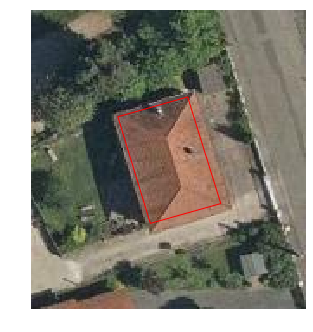

1047


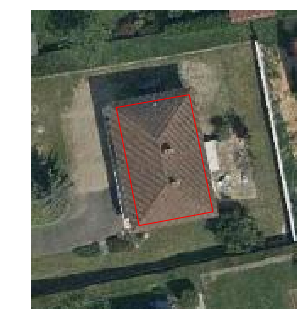

1079


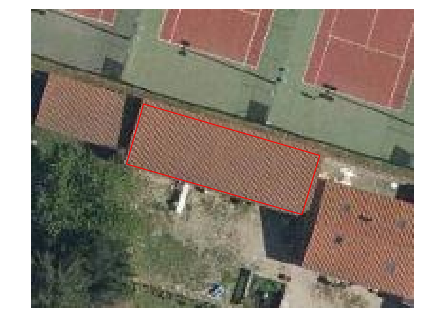

1170


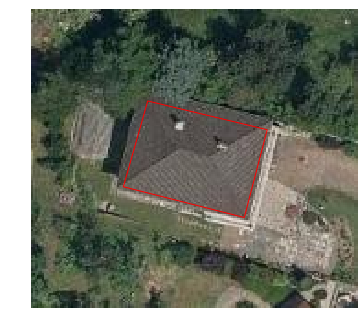

1207


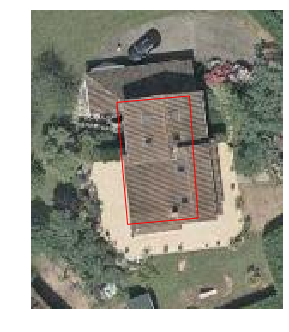

1460


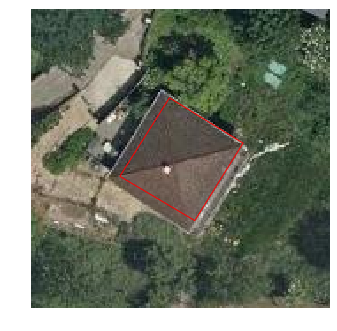

2605


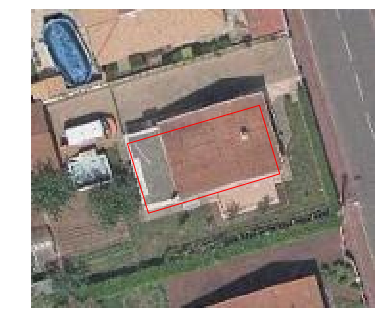

3945


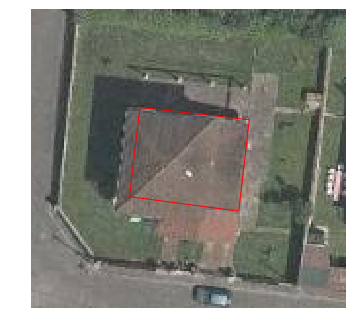

4149


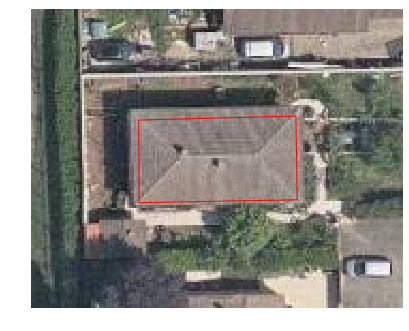

4760


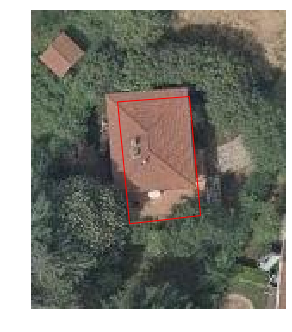

4815


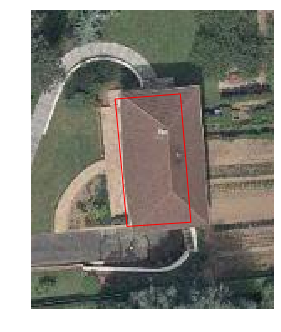

5227


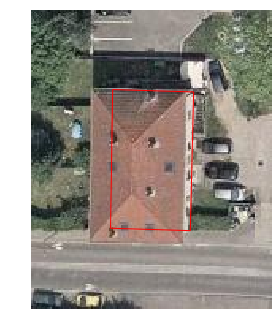

5401


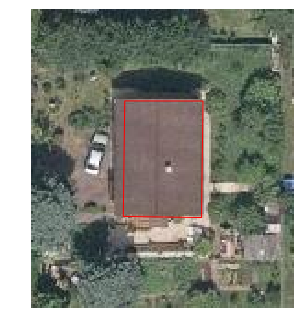

5461


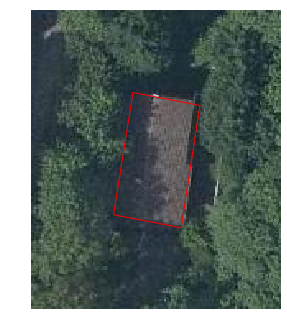

5842


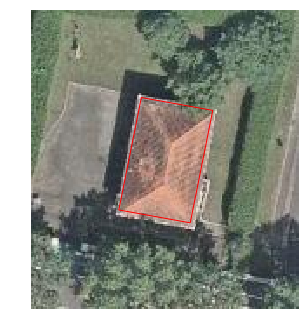

6166


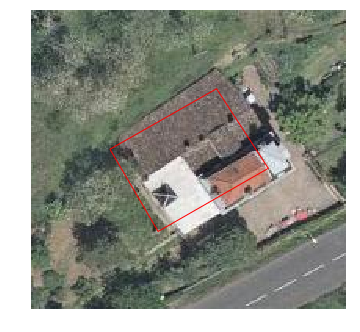

6181


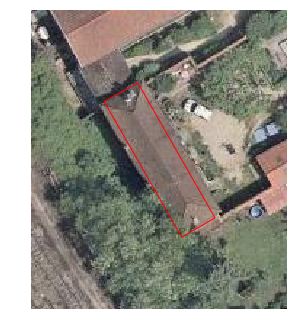

6243


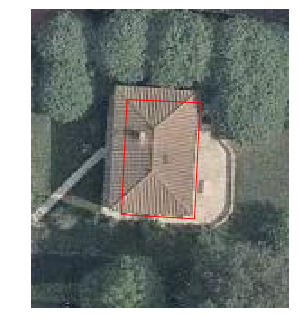

6726


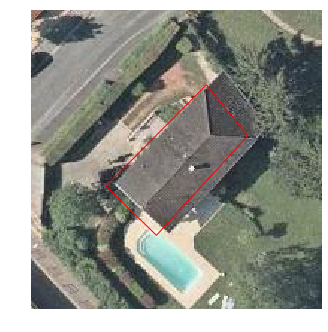

6767


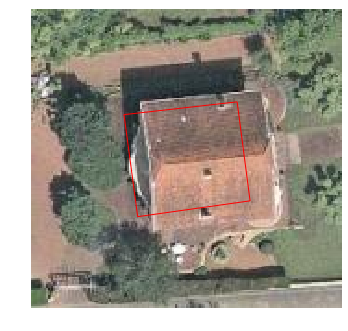

7675


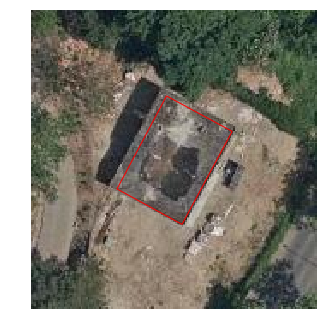

7774


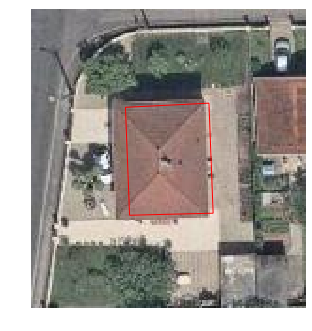

9136


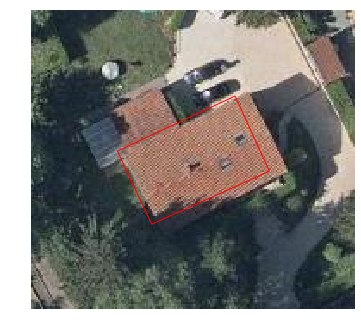

9621


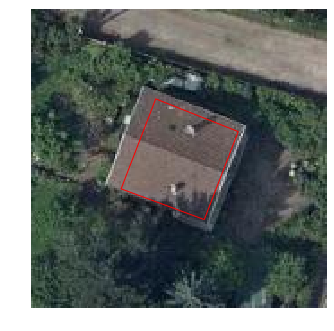

9688


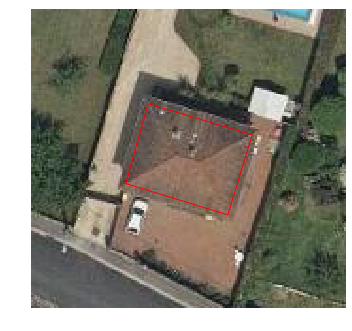

9934


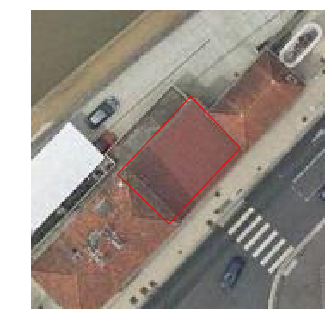

11094


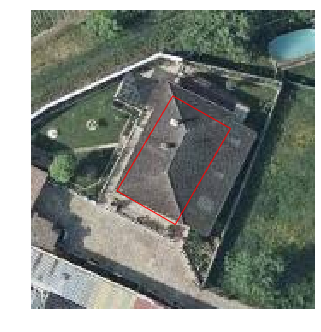

11178


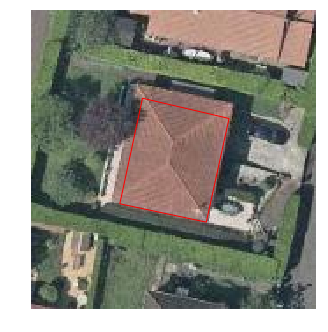

11245


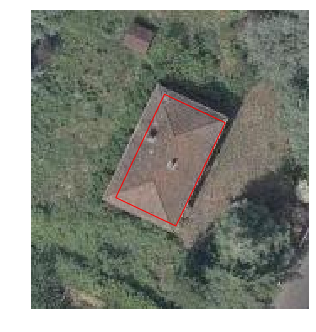

11830


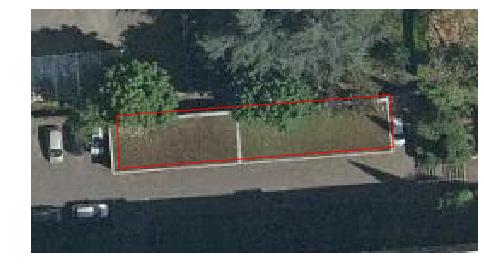

12340


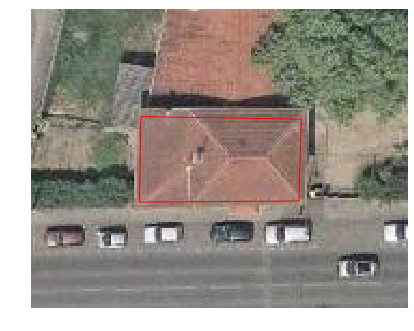

12455


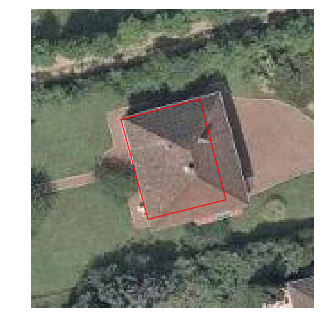

In [54]:
test_sample_sind = np.sort(test_sample_ind)
test_buildings_sample = buildings_clean.iloc[test_sample_sind]
# change k value to see each cluster
k=2
test_buildings_sample_k = test_buildings_sample.iloc[sym_kmeans[test_sample_sind]==kmeans_type[k]]
for ind,(_,building) in zip(test_sample_sind[sym_kmeans[test_sample_sind]==kmeans_type[k]],
                            test_buildings_sample_k.iterrows()):
    print(ind)
    show_building(building)

In [55]:
test_roofs_lab_comp=pd.read_csv('data/test_sample_labels_corr.csv')

In [56]:
test_roofs_lab_comp.groupby('lab').count()

,ind
lab,
0,14
1,48
2,33
3,5


In [59]:
# Save data to pickle file

pickle_file = 'data/labelled_samples.pickle'

try:
    f = open(pickle_file, 'wb')
    save = {
    'train_sample': roofs_lab_comp,
    'test_sample': test_roofs_lab_comp
    }
    pickle.dump(save, f, protocol=2)
    f.close()
except Exception as e:
    print('Unable to save data to', pickle_file, ':', e)
    raise

#### Measure how accurate is the initial labelling based on Kmeans

In [597]:
def cluster_acc(y_true, y_pred):
    assert y_pred.size == y_true.size
    D = max(y_pred.max(), y_true.max())+1
    w = np.zeros((D, D), dtype=np.int64)
    for i in range(y_pred.size):
        w[y_pred[i], y_true[i]] += 1
    ind = linear_assignment(w.max() - w)
    return round(100*sum([w[i, j] for i, j in ind])*1.0/y_pred.size,2), w

In [598]:
y_pred = np.array([kmeans_type[k] for k in sym_kmeans[sample_ind]])[np.argsort(sample_ind)]
y_true = np.array(roofs_lab_comp['lab'])
cluster_acc(y_true, y_pred)

(53.5, array([[14, 14,  2,  8,  1],
        [ 7, 56, 22,  1,  2],
        [ 6, 22, 37,  7,  1],
        [ 0,  0,  0,  0,  0],
        [ 0,  0,  0,  0,  0]]))

k=0


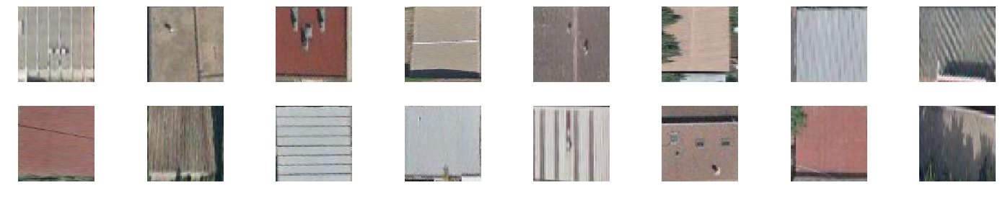

k=1


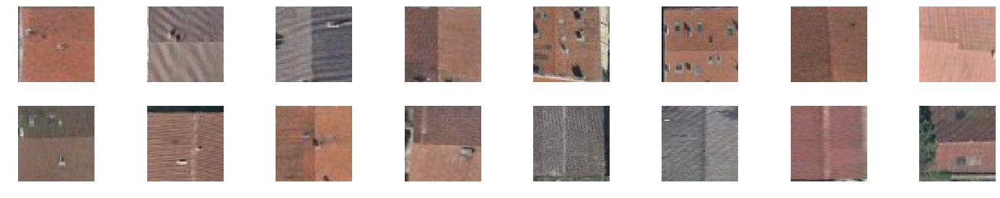

k=2


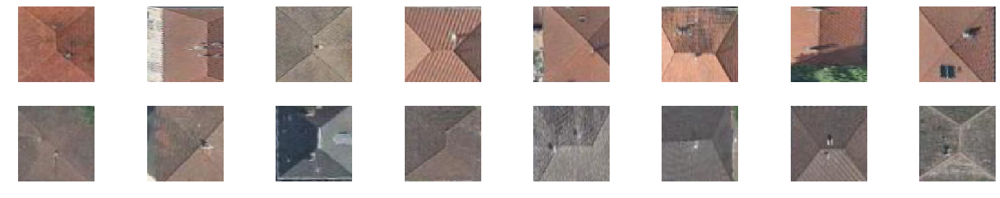

k=3


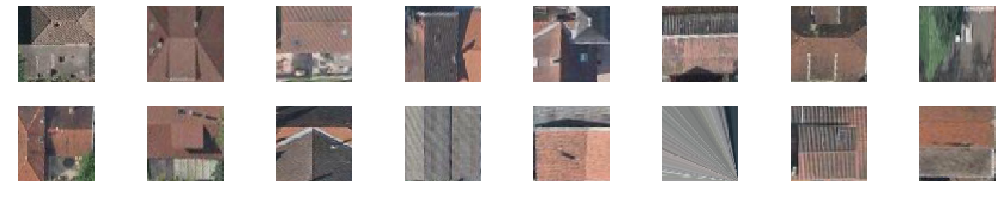

k=4


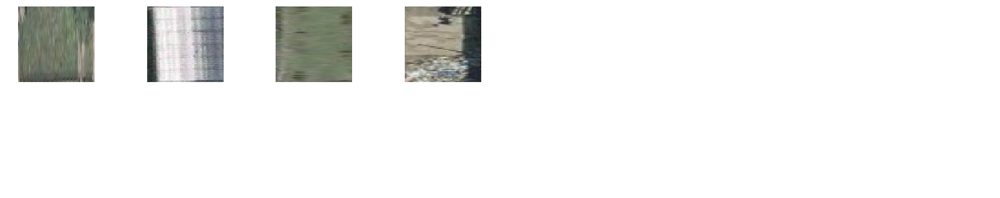

In [600]:
for k in set(roofs_lab_comp['lab']):
    print('k={}'.format(k))
    k_sel = roofs_lab_comp['lab'] == k
    k_ind = roofs_lab_comp['ind'][k_sel]
    roof_sel = roof_dataset_orig[k_ind]
    show_dataset(roof_sel, grid_size=(2,8), to_rgb=True)